In [27]:
import rasterio as rio
import earthpy.plot as ep
import pandas as pd
from rasterio.plot import reshape_as_image, reshape_as_raster
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import GridSearchCV, train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate
from sklearn.metrics import f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from joblib import load, dump
from sklearn.impute import SimpleImputer
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

In [2]:
def prep_image_for_ml(image, columns):
    '''
    Parameters
    ----------
    image : 3D numpy array
        Consisting of 19 bands
    
    columns : list
        column names to be given to the dataframe. Must be same length as number of bands + labels
        
    labelled : Boolean
        Whether the image land use is labelled 

    Returns
    -------
    Dataframe without nans.

    '''
    # change from band, x, y to x, y, band
    # then reshape into z columns, where z is the number of bands
    image_array = reshape_as_image(image)
    
    # convert all pixels to rows
    ml_prep_array = image_array.reshape(-1, image.shape[0])
    
    train_data = pd.DataFrame(data = ml_prep_array, columns = columns)
    
    # Drop nas
    train_data_cleaned = train_data.dropna().reset_index(drop = True)
    
    return train_data_cleaned

In [3]:
with rio.open('raw_data/ESA WorldCover 2020.tif') as src:
    land_cover = src.read()
    profile = src.profile
    src.close()
    
with rio.open('outputs/ghana_prepped_2020.tif') as src:
    ghana_2020 = src.read()
    profile = src.profile
    src.close()

data = np.vstack([ghana_2020, land_cover])

columns = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B9",
           "B11", "B12", "NDVI", "MNDWI", "BSI", "VV", "VH", "M", "class"]

data_reshaped = prep_image_for_ml(data, columns)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\matplotlib\cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


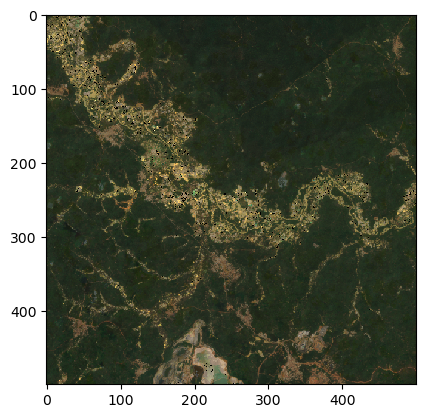

In [5]:
plt.imshow(reshape_as_image(data)[1250:1750, 1000:1500,[3,2,1]]*3, interpolation='nearest')

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


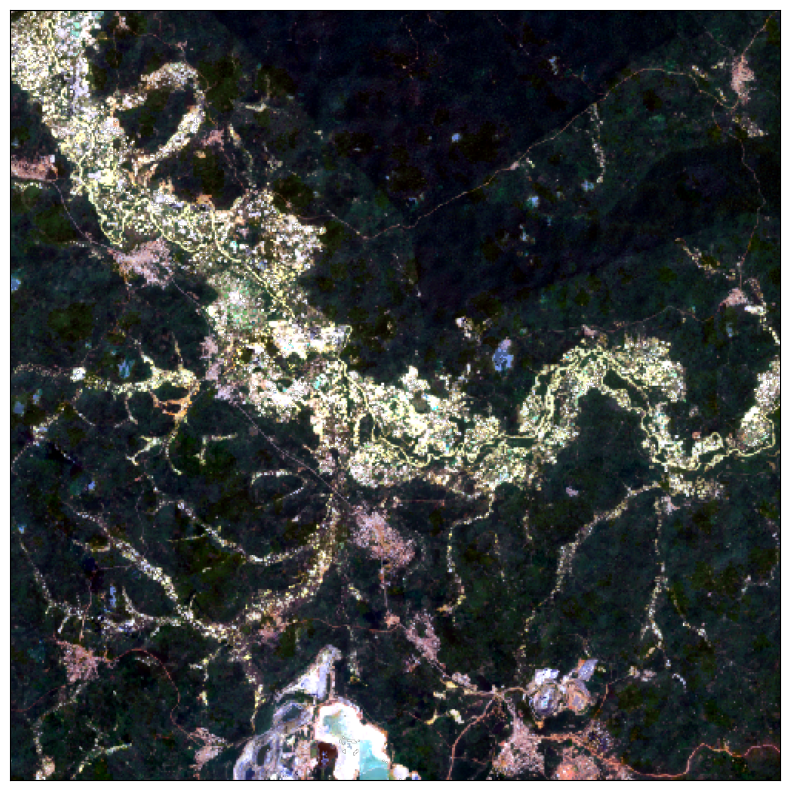

<Axes: >

In [6]:
ep.plot_rgb(data[:, 1250:1750, 1000:1500], rgb = (3,2,1), stretch = True)

In [8]:
knn_model = load('outputs/knn_model')

In [17]:
def prep_image_for_ml_predict(image, columns):
    '''
    Parameters
    ----------
    image : 3D numpy array
        Consisting of 19 bands
    
    columns : list
        column names to be given to the dataframe. Must be same length as number of bands + labels
        
    labelled : Boolean
        Whether the image land use is labelled 

    Returns
    -------
    Dataframe for prediction.

    '''
    # Save location of nans in original image
    nan_indices = np.isnan(image)
    
    # change from band, x, y to x, y, band
    # then reshape into z columns, where z is the number of bands
    image_array = reshape_as_image(image)
    
    # convert all pixels to rows
    ml_prep_array = image_array.reshape(-1, image.shape[0])
    
    train_data = pd.DataFrame(data = ml_prep_array, columns = columns)
    
    impute = SimpleImputer()

    # Remove nans - don't worry for now, we will impute again later
    train_data_cleaned = impute.fit_transform(train_data)
    
    return train_data_cleaned, nan_indices

In [19]:
# Limit to study area, and find nan_indices = assume that they are bare land
study_area = data[:, 1250:1750, 1000:1500]
# study_nan_indices = np.isnan(study_area)

columns = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B9",
           "B11", "B12", "NDVI", "MNDWI", "BSI", "VV", "VH", "M", "class"]

study_area_reshaped, nan_indices = prep_image_for_ml_predict(study_area, columns)

X_study = study_area_reshaped[:, :-1]

X_study
# X_study = study_area_reshaped.drop(columns = 'class')

array([[  0.0609    ,   0.07845   ,   0.12025   , ..., -10.20040418,
        -17.07195086,   0.62598008],
       [  0.0609    ,   0.09255   ,   0.13435   , ...,  -9.66645508,
        -16.24998741,   0.62701458],
       [  0.0453    ,   0.0645    ,   0.09985   , ...,  -8.09342183,
        -14.48568731,   0.64155265],
       ...,
       [  0.0291    ,   0.0322    ,   0.0582    , ...,  -8.63302788,
        -15.22223326,   0.63810801],
       [  0.0291    ,   0.0346    ,   0.0601    , ...,  -9.42692909,
        -15.77249981,   0.62590703],
       [  0.0291    ,   0.0295    ,   0.0526    , ...,  -7.10429257,
        -13.82271781,   0.66052043]])

In [21]:
X_study.shape

(250000, 18)

In [23]:
%%time
pred_lu_2020 = knn_model.predict(X_study)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


CPU times: total: 10min 36s
Wall time: 2min 43s


In [25]:
pred_image = pred_lu_2020.reshape(study_area.shape[1], study_area.shape[2])

pred_image

array([[3, 2, 3, ..., 0, 0, 0],
       [3, 3, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [36]:
pred_image[nan_indices[1, ...]] = 3

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


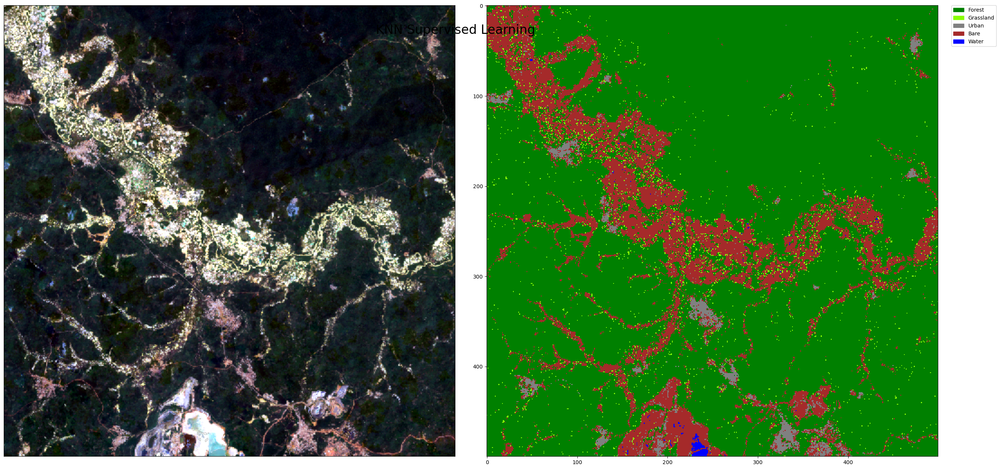

In [37]:
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

lulc_dict = dict((
    ("Forest", 0),
    ("Grassland", 1),
    ("Urban", 2),
    ("Bare", 3),
    ("Water", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(study_area, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(pred_image, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("KNN Supervised Learning", y=.8, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(pred_image))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

## Random Forest prediction

Appears to do marginally better at identifying locations of cropland.

In [38]:
rf_model = load('outputs/rf_model')

In [39]:
%%time
rfpred_lu_2020 = rf_model.predict(X_study)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


CPU times: total: 3.83 s
Wall time: 3.92 s


In [41]:
rfpred_image = rfpred_lu_2020.reshape(study_area.shape[1], study_area.shape[2])

rfpred_image[nan_indices[1, ...]] = 3

rfpred_image

array([[3, 2, 0, ..., 0, 0, 0],
       [3, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

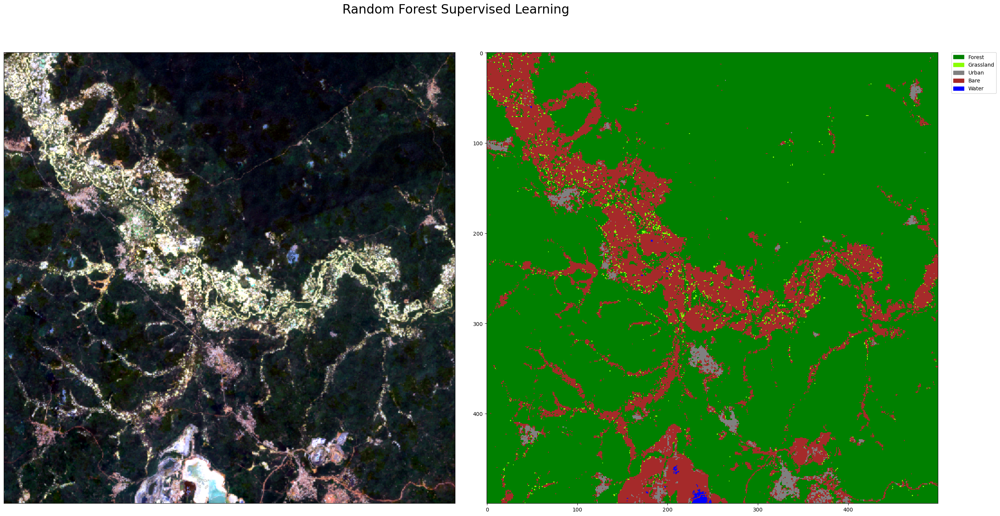

In [44]:
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

lulc_dict = dict((
    ("Forest", 0),
    ("Grassland", 1),
    ("Urban", 2),
    ("Bare", 3),
    ("Water", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(study_area, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(rfpred_image, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("Random Forest Supervised Learning", y=.9, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(rfpred_image))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

## Post-processing

Note that there's a lot of random Grassland being predicted across the image. We can consider getting rid of them using a median filter.

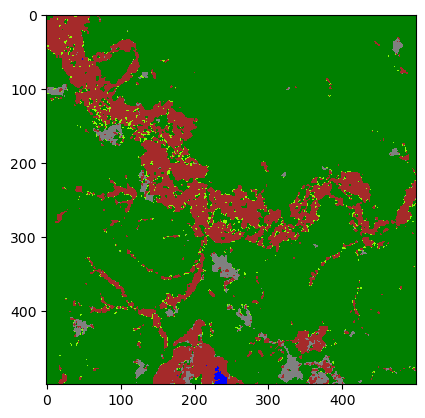

In [50]:
# Definitely helps with removing random grassland, but loses the roads
from scipy.ndimage import median_filter

median_array = median_filter(pred_image, size=3)

plt.imshow(median_array, cmap = cmap, interpolation='nearest')
# result_array

array([[3, 3, 2, ..., 0, 0, 0],
       [3, 2, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

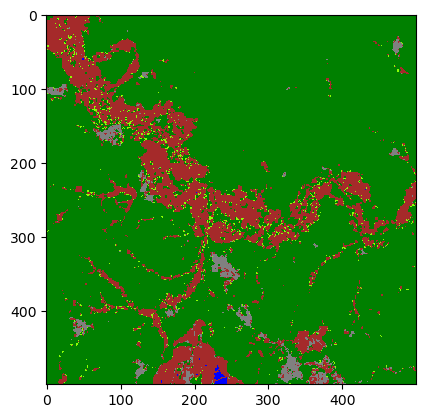

In [49]:
# generates kernels
from skimage.morphology import disk, ball, cube, rectangle

ball_array = median_filter(pred_image, footprint = ball(1)[1])

plt.imshow(ball_array, cmap = cmap, interpolation='nearest')
result_array

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


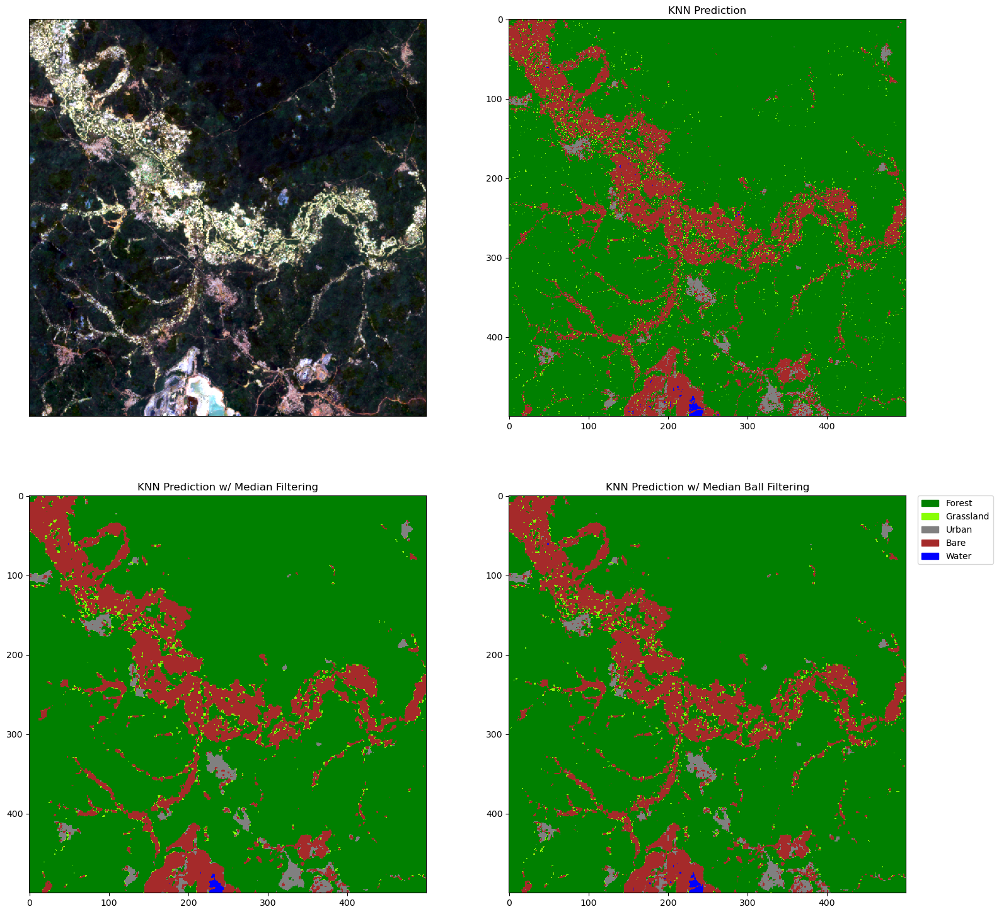

In [51]:
f, axs = plt.subplots(2, 2, figsize = (18,18))

ax = axs.flatten()

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(study_area, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(pred_image, cmap = cmap, interpolation='nearest')
ax[1].set_title('KNN Prediction')
ax[2].imshow(median_array, cmap = cmap, interpolation='nearest')
ax[2].set_title('KNN Prediction w/ Median Filtering')
ax[3].imshow(ball_array, cmap = cmap, interpolation='nearest')
ax[3].set_title('KNN Prediction w/ Median Ball Filtering')

fig.suptitle("KNN Supervised Learning with Median Filtering", y=.9, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(pred_image))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

The results are somewhat decent - you certainly remove a lot of the roads in the course of median filtering, but you also remove random grassland predictions in the middle of the forest.

## Random Forest on entire map

In [55]:
predict_data, nan_indices_data = prep_image_for_ml_predict(data, columns = columns)

In [56]:
X_data = predict_data[:, :-1]

X_data.shape

(6737276, 18)

In [57]:
%%time
rf_full_image = rf_model.predict(X_data)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [58]:
rf_full_image = rf_full_image.reshape(data.shape[1], data.shape[2])

rf_full_image[nan_indices_data[1, ...]] = 3

rf_full_image

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


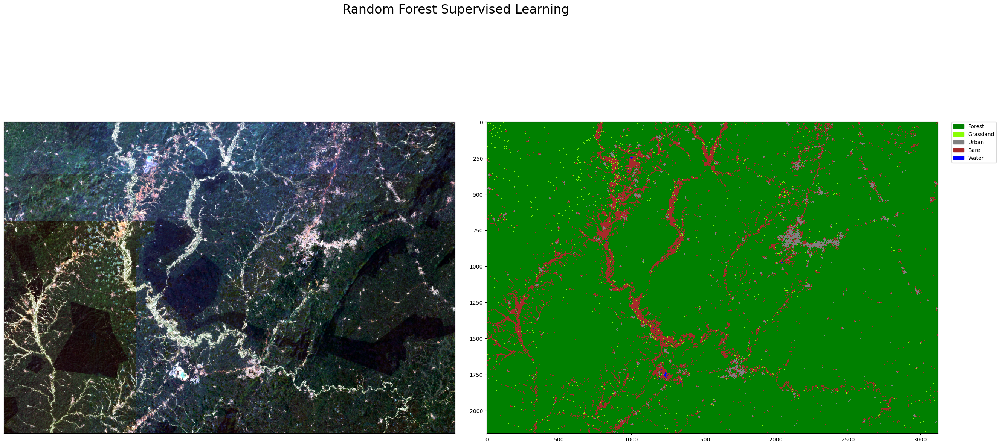

In [59]:
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

lulc_dict = dict((
    ("Forest", 0),
    ("Grassland", 1),
    ("Urban", 2),
    ("Bare", 3),
    ("Water", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(data, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(rf_full_image, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("Random Forest Supervised Learning", y=.9, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(rf_full_image))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

## Save predicted images

In [61]:
profile.update(dtype = np.int8, nodata = -128, count = 1)

profile

{'driver': 'GTiff', 'dtype': <class 'numpy.int8'>, 'nodata': -128, 'width': 3122, 'height': 2158, 'count': 1, 'crs': CRS.from_epsg(32630), 'transform': Affine(30.0, 0.0, 582360.0,
       0.0, -30.0, 710910.0), 'blockysize': 1, 'tiled': False, 'interleave': 'pixel'}

In [67]:
with rio.open('outputs/rf_full_2020.tif', 'w', **profile) as dst:
    # must save as 3D array with 1 band
    dst.write(np.expand_dims(rf_full_image, axis=0).astype(np.int8))
    dst.close()

In [72]:
## Create workflow for 2019, 2021, 2022

def raster_to_rf_predict(year, profile):
    '''
    Parameters
    ----------
    year : analogue for filename of image
        Consisting of 19 bands
    
    profile : rio.profile object 

    Returns
    -------
    image : original image raster
    rf_image : predicted land use based on rf_model

    '''

    with rio.open(f'outputs/ghana_prepped_{year}.tif') as src:
        image = src.read()
        src.close()

    columns = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B9",
               "B11", "B12", "NDVI", "MNDWI", "BSI", "VV", "VH", "M"]

    predict_data, nan_indices_data = prep_image_for_ml_predict(image, columns = columns)

    rf_image = rf_model.predict(predict_data)

    rf_image = rf_image.reshape(image.shape[1], image.shape[2])

    rf_image[nan_indices_data[1, ...]] = 3
    
    with rio.open(f'outputs/rf_full_{year}.tif', 'w', **profile) as dst:
        # must save as 3D array with 1 band
        dst.write(np.expand_dims(rf_image, axis=0).astype(np.int8))
        dst.close()
        
    return image, rf_image

In [68]:
with rio.open('outputs/ghana_prepped_2019.tif') as src:
    ghana_2019 = src.read()
    src.close()

columns = ["B1", "B2", "B3", "B4", "B5", "B6", "B7", "B8", "B8A", "B9",
           "B11", "B12", "NDVI", "MNDWI", "BSI", "VV", "VH", "M"]

predict_data, nan_indices_data = prep_image_for_ml_predict(ghana_2019, columns = columns)

rf_ghana_2019 = rf_model.predict(predict_data)

rf_ghana_2019 = rf_ghana_2019.reshape(ghana_2019.shape[1], ghana_2019.shape[2])

rf_ghana_2019[nan_indices_data[1, ...]] = 3

rf_ghana_2019

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\earthpy\spatial.py:561: RuntimeWarning: invalid value encountered in cast
  return (bytedata.clip(low, high) + 0.5).astype("uint8")


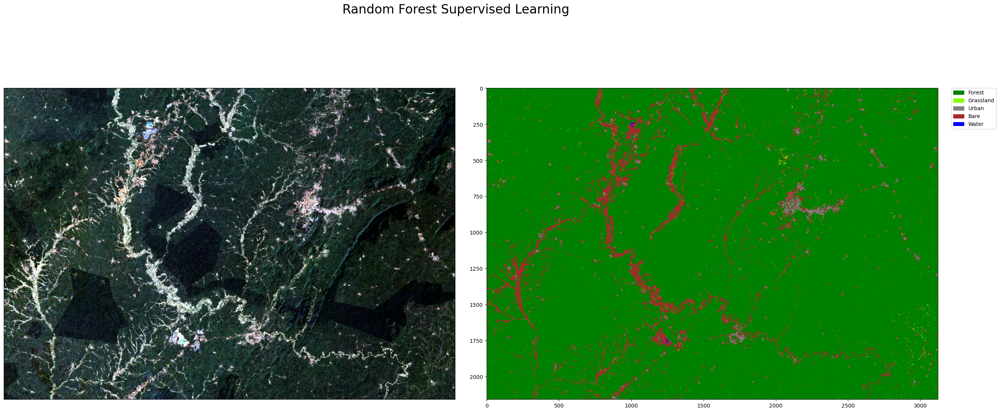

In [69]:
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

lulc_dict = dict((
    ("Forest", 0),
    ("Grassland", 1),
    ("Urban", 2),
    ("Bare", 3),
    ("Water", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(ghana_2019, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(rf_ghana_2019, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("Random Forest Supervised Learning", y=.85, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(rf_ghana_2019))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

In [70]:
with rio.open('outputs/rf_full_2019.tif', 'w', **profile) as dst:
    # must save as 3D array with 1 band
    dst.write(np.expand_dims(rf_ghana_2019, axis=0).astype(np.int8))
    dst.close()

In [74]:
%%time
ghana_2021 = raster_to_rf_predict('2021', profile)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


CPU times: total: 2min 2s
Wall time: 2min 4s


In [75]:
%%time
ghana_2022 = raster_to_rf_predict('2022', profile)

C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


CPU times: total: 1min 57s
Wall time: 1min 59s


In [ ]:
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

lulc_dict = dict((
    ("Forest", 0),
    ("Grassland", 1),
    ("Urban", 2),
    ("Bare", 3),
    ("Water", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

colors = ["green", "xkcd:lime green", "grey", "brown", "blue"]
cmap = ListedColormap(colors)

ep.plot_rgb(ghana_2019, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(rf_ghana_2019, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("Random Forest Supervised Learning", y=.85, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(rf_ghana_2019))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )